# Rethinking Statistics course in Python - Week 2

Lecture 3: Geocentric Models

- [Video](https://youtu.be/h5aPo5wXN8E)
- [Slides](https://speakerdeck.com/rmcelreath/l03-statistical-rethinking-winter-2019)

Lecture 4: Wiggly Orbits

- [Video](https://youtu.be/ENxTrFf9a7c)
- [Slides](https://speakerdeck.com/rmcelreath/l04-statistical-rethinking-winter-2019)

[Proposed problems](https://github.com/gbosquechacon/statrethinking_winter2019/blob/master/homework/week02.pdf) and [solutions in R](https://github.com/gbosquechacon/statrethinking_winter2019/blob/master/homework/week02_solutions.pdf) for the exercises of the week.

In [1]:
%matplotlib inline
import pymc3 as pm
import numpy as np
import pandas as pd
import theano

from scipy import stats
from sklearn.metrics import mean_squared_error
import math
# patsy for B splines
import patsy

import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
alt.data_transformers.enable('default', max_rows=None)
import arviz as az # exploratory analysis for bayesian analysis

import warnings
warnings.filterwarnings('ignore')

# Gaussian/Normal Introduction

Code showing why many processes end up being normally distributed.

Staring with normal by addition. Pg 72 in book.

In [2]:
# function for one random walk
def random_walk(i):
    # one random walk moving left or right at random over 16 steps
    steps_loc = np.random.uniform(low = -1, high = 1, size = 16)
    # dataframe of steps
    steps_df = pd.DataFrame(
        {'i': i,
         'steps': [i for i in range(1,17)],
         'loc': steps_loc
        })
    # final location after 16 steps
    final_loc = np.sum(steps_loc)
    # final dict of sum and vector of steps
    loc_dict = {'steps_df': steps_df, 'final_loc': final_loc}
    return(loc_dict)

In [3]:
# run over 1k i
walk_sample = [random_walk(i) for i in range(1000)]

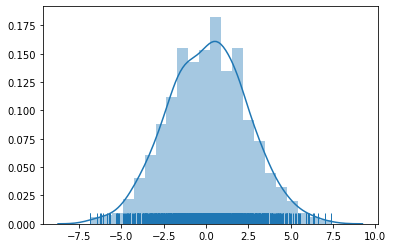

In [4]:
# plot of final change in distance; normal 
sns.distplot([i['final_loc'] for i in walk_sample], rug=True)

### Trying to replicate walk plot of 4.2.... 

<i>Ryan Note: Tried to replicate upper plot of 4.2 on page 73 of walks over steps, 
    but I think I need to initialize the start point at 0 and add to it rather than sum. 
    However, I think that's the key point </i>
    
<b> Normal by addition: Any process that adds together random valvues 
    from the same distribution converges to a normal! </b>

In [69]:
# steps df
walks_sample_df = pd.concat(pd.DataFrame(l['steps_df']) for l in walk_sample)

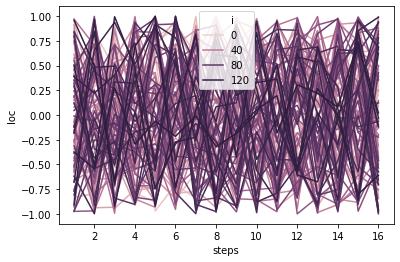

In [59]:
# this isn't quite the same. I think i need to start at 0 then add new location to that initial location
sns.lineplot(
    x='steps',
    y='loc',
    hue='i',
    legend = 'brief',
    data=walks_sample_df

)

# Short Intro

_Example of building a prior manually (kind of a pain):_

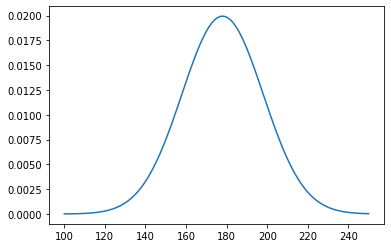

In [70]:
x = np.linspace(100, 250, 100)
plt.plot(x, stats.norm.pdf(x, 178, 20));

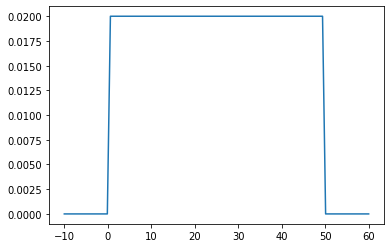

In [71]:
x = np.linspace(-10, 60, 100)
plt.plot(x, stats.uniform.pdf(x, 0, 50));

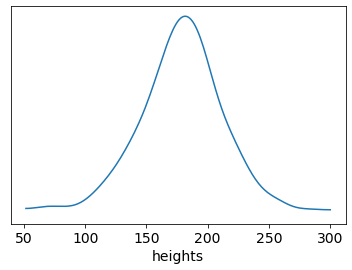

In [72]:
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=20, size=n_samples)
sample_sigma = stats.uniform.rvs(loc=0, scale=50, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma)
pm.kdeplot(prior_h)
plt.xlabel('heights', fontsize=14)
plt.yticks([]);

## Exercise 1

>The weights listed below were recorded in the !Kung census, but heights were not recorded for these individuals. Provide predicted heights and 89% compatibility intervals for each of these individuals. That is, fill in the table below, using model-based predictions.

In [73]:
aux = pd.DataFrame(np.array([45, 40, 65, 31, 53])).reset_index().rename(columns={'index':'Individual',0:'weight'})
aux['expected height']=np.nan
aux['89% interval'] = np.nan
aux

,Individual,weight,expected height,89% interval
0,0,45,NaN,NaN
1,1,40,NaN,NaN
2,2,65,NaN,NaN
3,3,31,NaN,NaN
4,4,53,NaN,NaN


_Let's get the data._

The weights that interest us are all adult weights, so we can analyze only the adults and make an okay linear approximation. If you did something else, that's okay. I deliberately made the question a little vague. Loading the data, selecting out adults, and doing the regression from the book:

In [5]:
d = pd.read_csv('../../data/Howell1.csv', sep=';', header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


Subset to adults over age 18

In [6]:
d2 = d[d.age >= 18].reset_index(drop=True)
d2 = d2.assign(weight_c=pd.Series(d2.weight - d2.weight.mean()))

_This is the first of many times that a model is defined in pymc3 in this course so I'll take a moment to explain a bit its general structure. First the model is defined and named, in this case as_ `model_1`. _Then there are four basic sections within it:_

1. _**Data**: where the data that model needs is defined. I'm taking advantage here of the Data container class recently included in pymc3 v3.7. This class wraps the theano shared variable class and let the model be aware of its inputs and outputs. In the later notebooks I usually define the data outside of the model because it saves some space when comparing models but for a individual model I think is just a bit nicer. This is very useful for making predictions with the model for data not used for its fitting, something extremely common in Machine Learning_ ($Xtest$ _anyone?). In the course and the book this is usually called out-of-sample prediction but in general Data Science we refer to it as just measuring the accuracy of the model on the test set. More information on the Data class can be found_ [here](https://docs.pymc.io/notebooks/data_container.html) _and_ [here](https://docs.pymc.io/api/data.html) _and on the out-of-sample (and in-sample) prediction in_ [here](https://pymc3.readthedocs.io/en/latest/notebooks/posterior_predictive.html).

2. _**Priors**: where the priors are defined. This priors are the initial distributions our parameters evolve from. They are supposed to represent our knowledge about our system and the nature of reality and maths jeje. For instance, a standard deviation can not be negative so we initialize it as a Uniform distribution with lower bound zero. In the course this is mentioned again and again._

3. _**Regression**: where we define the actual structure of the model, in this case a linear regression (to estimate $\mu$) and where we also define the prior for our output variable, in this case_ `height_hat`. _I will be using the "hat" subindex in the output metric of almost all models to express that it is the model estimation of the original variable, in this case_ `height`.

4. _**Prior, trace and posterior**: where the priors are sampled from and where the posteriors are estimated and sampled from. Most of the time we will not need neither the priors or the posterior predictions only the parameters, that are stored in the trace. However, I think its a good policy to have in all models to keep all concepts in mind and just uncomment them when we need them (like in this exercise)._

In [7]:
with pm.Model() as model_1:
    # Data
    weight = pm.Data('weight', d2['weight_c'].values)
    height = pm.Data('height', d2['height'].values)
    
    # Priors
    alpha = pm.Normal('alpha', mu=178, sd=20)
    beta = pm.Normal('beta', mu=0, sd=10)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    # Regression
    mu = alpha + beta * weight # weight here is the same as (x - xbar) or (weight - mean(weight))
    height_hat = pm.Normal('height_hat', mu=mu, sd=sigma, observed=height)
    
    # Prior sampling, trace definition and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior_1 = pm.sample(draws=1000, tune=1000)
    posterior_pred_1 = pm.sample_posterior_predictive(posterior_1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta, alpha]
100%|██████████| 4000/4000 [00:33<00:00, 121.18it/s]


_Let's get summaries and traces using both `az` and `pm`._

In [9]:
# az package helps for easily extracting summaries
az.summary(posterior_1, credible_interval=.89).round(2)
#pm.summary(posterior_1, alpha=.11).round(2)# also possible

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha,154.6,0.27,154.16,155.01,0.0,0.0,6248.0,6248.0,6299.0,2951.0,1.0
beta,0.9,0.04,0.84,0.98,0.0,0.0,6197.0,6194.0,6251.0,2853.0,1.0
sigma,5.1,0.20,4.80,5.41,0.0,0.0,5883.0,5839.0,5932.0,3476.0,1.0


_Both pymc3 and arviz have traceplots functions to see how the distribution of each parameter looks like. There usually are four curves per parameter since four chains is the default when running the model._

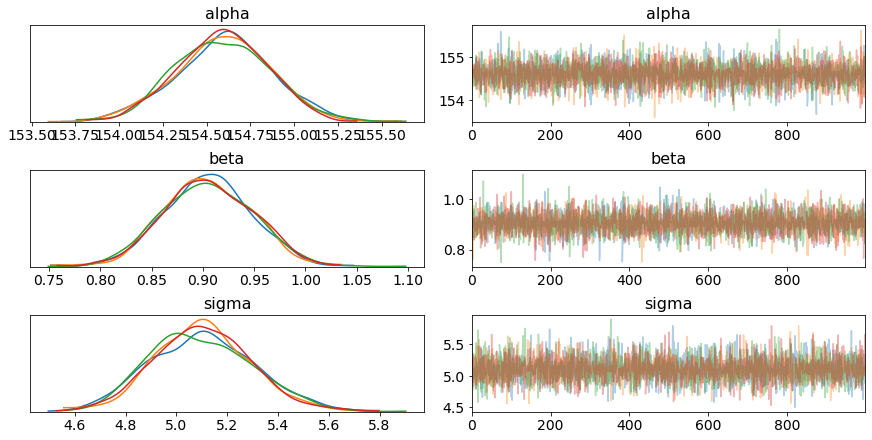

In [10]:
pm.traceplot(posterior_1);
#az.plot_trace(posterior_1); #also possible

_Let's get a predicted value for each of our original samples. This is not requested by the exercise but I think it makes sense first to estimate how good our predictions are in-sample (or in $X_{train}$) before moving to doing predictions out-of-sample ($X_{test}$)._

In [88]:
posterior_pred_1['height_hat'].shape

(4000, 352)

_We got 1000 draws (times 4 chains) for_ `height_hat` _for each of the original exercise samples. Let's just take the mean for each original sample and build a new column for it in the original dataset._

In [91]:
d2 = d2.assign(height_hat=np.mean(posterior_pred_1['height_hat'],axis=0))
d2.head()

,height,weight,age,male,weight_c,height_hat
0,151.765,47.825606,63.0,1,2.835121,157.055919
1,139.700,36.485807,63.0,0,-8.504679,146.766364
2,136.525,31.864838,65.0,0,-13.125648,142.761769
3,156.845,53.041915,41.0,1,8.051429,162.044888
4,145.415,41.276872,51.0,0,-3.713614,151.158665


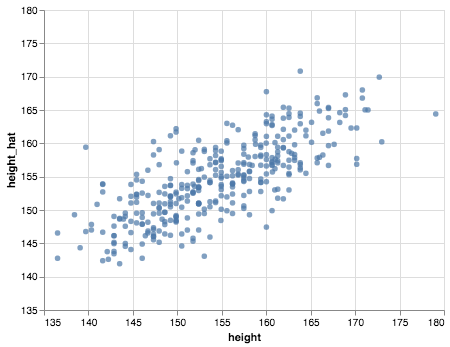

In [92]:
plot = alt.Chart(d2)\
   .mark_circle()\
   .encode(
        x=alt.X('height', title='height',scale=alt.Scale(domain=(135, 180))),
        y=alt.Y('height_hat', title='height_hat',scale=alt.Scale(domain=(135, 180)))
          )

plot

In [93]:
print(f'The RMSE in X_train is {round(math.sqrt(mean_squared_error(d2.height.values, d2.height_hat.values)),2)} cm.')

The RMSE in X_train is 5.07 cm.


_I think thats a reasonably good RMSE. Let's build now the High Posterior Density Interval for each original sample._

In [94]:
height_hat_hpd = pm.hpd(posterior_pred_1['height_hat'], alpha=0.11)
#height_hat_hpd = az.hpd(posterior_pred_1['height_hat'], credible_interval=.89) # is also good

In [95]:
hpdi = pd.DataFrame(height_hat_hpd).rename({0:'lower_hpdi',1:'upper_hpdi'}, axis=1)
d3 = pd.concat([d2,hpdi], axis = 1)
round(d3.head(5),2)

,height,weight,age,male,weight_c,height_hat,lower_hpdi,upper_hpdi
0,151.76,47.83,63.0,1,2.84,157.06,149.11,165.30
1,139.70,36.49,63.0,0,-8.50,146.77,138.87,155.27
2,136.52,31.86,65.0,0,-13.13,142.76,134.98,151.08
3,156.84,53.04,41.0,1,8.05,162.04,153.91,170.31
4,145.42,41.28,51.0,0,-3.71,151.16,143.05,159.63


_Let's finally predict the values requested by the exercise. We had our original variables stored in `aux`._

_In order to use the model to predict on unseen data we need to swap the values stored in the data within the model. I know, it's a bit convoluted but you get used to it jeje. In this case we had two inputs: `weight` and `height` but actually only have information regarding `weight` for our new individuals so we only update this variable. It is a bit odd though that the dependent variable, in this case `height` can just remain holding the original training data and things work fine. I guess that_ `sample_posterior_predictive` _does not use it. Since the dimensions do not match (training data has 352 indiviuals and test data only 5) I guess it's the only possible explanation._

_I read_ [here](https://discourse.pymc.io/t/how-to-predict-new-values-on-hold-out-data/2568/7) _that some people define a $fake-holdout-y$ with the same dimensions as_ $X_{test}$ _but at least now it seems unnecessary (check also_ [this](https://pymc3.readthedocs.io/en/latest/notebooks/posterior_predictive.html) _where only the predictors are updated). Maybe someone can PR this and shed some light here._

_In any case the predictions are good and match perfectly those obtained in the original R solutions._

In [97]:
weight.set_value(aux.weight.values-np.mean(d2.weight))

_Once the data is swapped we use_ `sample_posterior_predictive` _again over the original trace and model._

In [98]:
posterior_pred_1 = pm.sample_posterior_predictive(trace = posterior_1, samples = 500, model = model_1)

100%|██████████| 500/500 [00:04<00:00, 102.69it/s]


_And we finally get the requested values for the new individuals._

In [102]:
aux['expected height'] = posterior_pred_1['height_hat'].mean(axis=0)
aux['89% interval'] = pd.Series(list(pm.hpd(posterior_pred_1['height_hat'], alpha=0.11)))
aux

,Individual,weight,expected height,89% interval
0,0,45,154.743836,"[145.93186452332498, 162.62791601353945]"
1,1,40,150.187117,"[142.5010200595038, 158.771754683346]"
2,2,65,172.910241,"[165.59793704781544, 181.84741101573573]"
3,3,31,142.152556,"[134.0163386463328, 149.94326878546153]"
4,4,53,161.930203,"[154.01868094889738, 169.31647208083118]"


## Exercise 2

>Model the relationship between `height` (cm) and the natural logarithm of weight (log-kg): `log(weight)`. Use the entire `Howell1` data frame, all 544 rows, adults and non-adults. Use any model type from Chapter 4 (_from the book_) that you think useful: an ordinary linear regression, a polynomial or a spline. Plot the posterior predictions against the raw data.

In [11]:
d2 = d
d2 = d2.assign(log_weight_c=pd.Series(np.log(d2.weight) - np.log(d2.weight).mean()))

In [12]:
with pm.Model() as model_2:
    # Data
    log_weight = pm.Data('log_weight', d2['log_weight_c'].values)
    height = pm.Data('height', d2['height'].values)
    
    # Priors
    alpha = pm.Normal('alpha', mu=178, sd=20)
    beta = pm.Lognormal('beta', mu=0, sd=1) # Ryan change to log normal since weight is logged
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    # Regression
    mu = alpha + beta * log_weight
    height_hat = pm.Normal('height_hat', mu=mu, sd=sigma, observed=height)
    
    # Prior sampling, trace definition and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior_2 = pm.sample(draws=1000, tune=1000)
    posterior_pred_2 = pm.sample_posterior_predictive(posterior_2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta, alpha]
100%|██████████| 4000/4000 [00:34<00:00, 115.13it/s]


_Let's get summaries and traces using both `az` and `pm`._

In [141]:
az.summary(posterior_2, credible_interval=.89).round(2)
#pm.summary(trace_model_2, alpha=.11).round(2) also possible

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha,138.27,0.22,137.92,138.60,0.0,0.0,5525.0,5524.0,5557.0,2996.0,1.0
beta,47.07,0.38,46.46,47.67,0.0,0.0,6450.0,6434.0,6476.0,2984.0,1.0
sigma,5.16,0.16,4.91,5.42,0.0,0.0,6809.0,6771.0,6855.0,3219.0,1.0


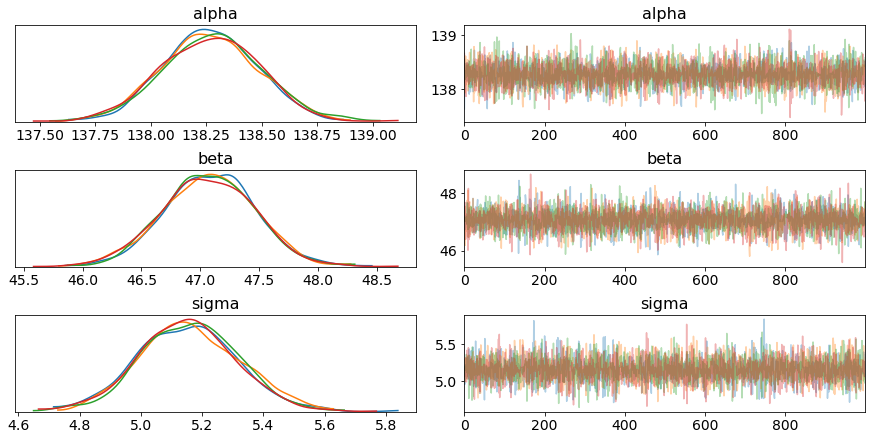

In [142]:
pm.traceplot(posterior_2);
#az.plot_trace(trace_model_2); #also possible

In [143]:
d2 = d2.assign(height_hat=np.mean(posterior_pred_2['height_hat'],axis=0)) # just as the previous exercise, we recover the mean of height_hat for each sample

In [144]:
height_pred_hpd = pm.hpd(posterior_pred_2['height_hat'], alpha=0.11) # and the High Posterior Density interval for each sample as well
# az.hpd(height_pred['height_hat'], credible_interval=.89) is also good

_Some harmless data wragling and plotting:_

In [145]:
hpdi = pd.DataFrame(height_pred_hpd).rename({0:'lower_hpdi',1:'upper_hpdi'}, axis=1)
d2 = pd.concat([d2,hpdi], axis = 1)
# make log weight
d2 = d2.assign(log_weight = np.log(d2.weight))
d2_plot = d2.melt(id_vars=['log_weight'],
                  value_vars=['height','height_hat'],
                  var_name='height_origin',
                  value_name='heights')

## Fix to solution is to predict at log weight and exponentiate 

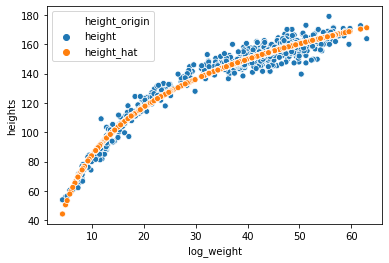

In [163]:
sns.scatterplot(x=np.exp(d2_plot['log_weight']), y=d2_plot['heights'], hue=d2_plot['height_origin'])

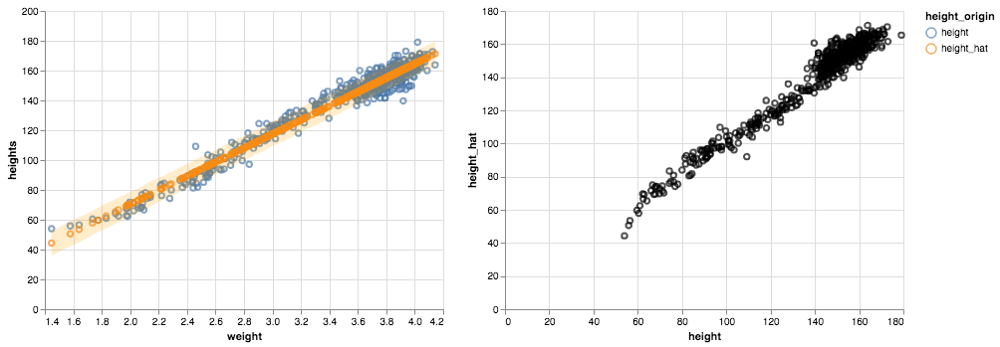

In [182]:
plot = alt.Chart(d2_plot.query('height_origin.isin(["height","height_hat"])'))\
   .mark_point()\
   .encode(
        x=alt.X('log_weight', title='weight',scale=alt.Scale(domain=(1.4, 4.2))),
        y=alt.Y('heights', title='heights',scale=alt.Scale(domain=(0, 180))),
        color='height_origin'
          )

plot_hpdi = alt.Chart(d2)\
   .mark_area(opacity=0.2, color='orange')\
   .encode(
        x=alt.X('log_weight', title='weight',scale=alt.Scale(domain=(1.4, 4.2))),
        y='lower_hpdi:Q',
        y2='upper_hpdi:Q'
          )

plot_2 = alt.Chart(d2)\
   .mark_point(color='black')\
   .encode(
        x=alt.X('height', title='height',scale=alt.Scale(domain=(0, 180))),
        y=alt.Y('height_hat', title='height_hat',scale=alt.Scale(domain=(0, 180)))
          )

alt.hconcat(plot+plot_hpdi,plot_2)

_Results are meh. I don't know why I get a worst fit that the R solution. Since the parameters are not shown I cannot trace back the error but the code seems fine to me. Let's see what happens when we take a polynomial regression of second degree._

Ryan note: It's because the predictions were made on the untransformed weights, needs to be on the logged weights. Weight is still on log scale; not familiar enough with altair to 
change scale to exponentiated.

In [13]:
d2 = d
d2 = d2.assign(weight_c=pd.Series(d2.weight - d2.weight.mean())/d2.weight.std())
d2 = d2.assign(weight_c_2=pd.Series(d2.weight_c**2)) # polynomial term of squared weights

In [14]:
with pm.Model() as model_2_2:
    # Data
    weight_c = pm.Data('weight_c', d2['weight_c'].values)
    weight_c_2 = pm.Data('weight_c_2', d2['weight_c_2'].values)
    height = pm.Data('height', d2['height'].values)
    
    # Priors
    alpha = pm.Normal('alpha', mu=178, sd=20)
    beta1 = pm.Lognormal('beta1', mu=0, sd=1) # note this is a lognormal, not a normal, just to follow the code of the book as close as possible (a normal works just as good)
    beta2 = pm.Normal('beta2', mu=0, sd=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    # Regression
    mu = alpha + beta1 * weight_c + beta2 * weight_c_2
    height_hat = pm.Normal('height_hat', mu=mu, sd=sigma, observed=height)
    
    # Prior sampling, trace definition and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior_2_2 = pm.sample(draws=1000, tune=1000)
    posterior_pred_2_2 = pm.sample_posterior_predictive(posterior_2_2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta2, beta1, alpha]
100%|██████████| 4000/4000 [00:34<00:00, 115.68it/s]


Let's get summaries and traces using both `az` and `pm`.

In [15]:
az.summary(posterior_2_2, credible_interval=.89).round(2)
#pm.summary(trace_model_2_2, alpha=.11).round(2) also possible

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha,146.06,0.37,145.47,146.66,0.01,0.0,2381.0,2381.0,2389.0,2708.0,1.0
beta2,-7.80,0.28,-8.30,-7.39,0.01,0.0,2227.0,2227.0,2232.0,2676.0,1.0
beta1,21.73,0.30,21.28,22.22,0.01,0.0,2649.0,2644.0,2672.0,2960.0,1.0
sigma,5.80,0.18,5.51,6.09,0.00,0.0,3337.0,3325.0,3355.0,2958.0,1.0


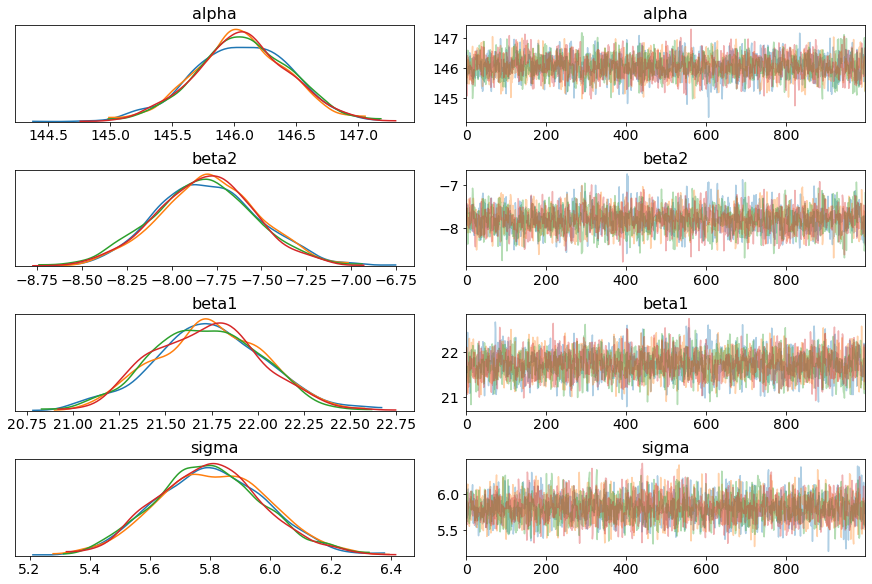

In [16]:
pm.traceplot(posterior_2_2);
#az.plot_trace(posterior_2_2); #also possible

In [17]:
d2 = d2.assign(height_hat=np.mean(posterior_pred_2_2['height_hat'],axis=0))

In [18]:
height_pred_hpd = pm.hpd(posterior_pred_2_2['height_hat'], alpha=0.11)
# az.hpd(height_pred['height_hat'], credible_interval=.89) is also good

In [19]:
hpdi = pd.DataFrame(height_pred_hpd).rename({0:'lower_hpdi',1:'upper_hpdi'}, axis=1)
d2 = pd.concat([d2,hpdi], axis = 1)
d2_plot = d2.melt(id_vars=['weight'],
                  value_vars=['height','height_hat'],
                  var_name='height_origin',
                  value_name='heights')

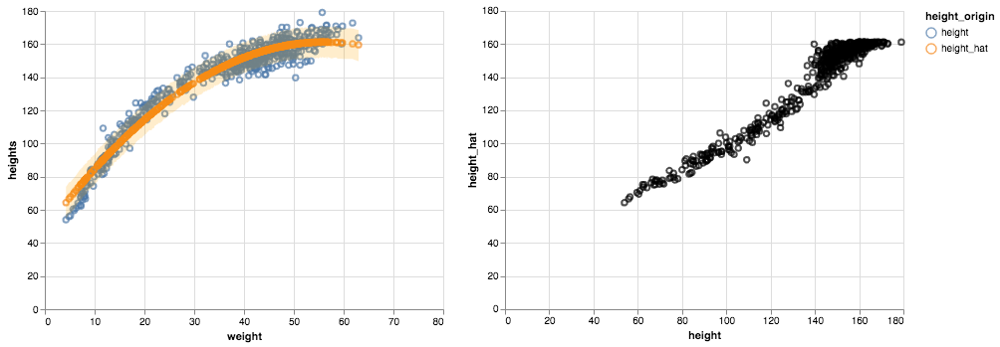

In [20]:
plot = alt.Chart(d2_plot.query('height_origin.isin(["height","height_hat"])'))\
   .mark_point()\
   .encode(
        x=alt.X('weight', title='weight',scale=alt.Scale(domain=(0, 80))),
        y=alt.Y('heights', title='heights',scale=alt.Scale(domain=(0, 180))),
        color='height_origin'
          )

plot_hpdi = alt.Chart(d2)\
   .mark_area(opacity=0.2, color='orange')\
   .encode(
        x=alt.X('weight', title='weight',scale=alt.Scale(domain=(0, 80))),
        y='lower_hpdi:Q',
        y2='upper_hpdi:Q'
          )

plot_2 = alt.Chart(d2)\
   .mark_point(color='black')\
   .encode(
        x=alt.X('height', title='height',scale=alt.Scale(domain=(0, 180))),
        y=alt.Y('height_hat', title='height_hat',scale=alt.Scale(domain=(0, 180)))
          )

alt.hconcat(plot+plot_hpdi,plot_2)

_Much better now._

## Exercise 3

> Plot the prior predictive distribution for the polynomial regression model in Chapter 4 (_just what we did in the previous exercise_). You can modify the the code that plots the linear regression prior predictive distribution. 20 or 30 parabolas from the prior should suffice to show where the prior probability resides. Can you modify the prior distributions of `alpha`, `beta1`, and `beta2` so that the prior predictions stay within the biologically reasonable outcome space? That is to say: Do not try to fit the data by hand. But do try to keep the curves consistent with what you know about height and weight, before seeing these exact data.

_We have already sampled the prior with the_ `sample_prior_predictive` _function within the model. Super-easy sintax. Let's do it, with 30 samples is enough for plotting._

In [21]:
az.summary(prior, credible_interval=.89).round(2)
# using summary with the priors is just a bit ugly, a bunch of warnings trigger and NaNs are produced

arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.
arviz.stats.stats_utils - WARNING - Array contains NaN-value.


,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
beta1_log__,0.08,0.96,-2.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
height,138.26,27.60,53.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
beta1,1.73,2.19,0.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
beta2,-0.00,1.08,-3.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weight_c,0.00,1.00,-2.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weight_c_2,1.00,1.03,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
height_hat,178.80,34.78,124.35,234.44,0.89,0.63,1532.0,1525.0,1456.0,3452.0,1.24
sigma_interval__,-0.17,1.94,-7.34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
alpha,178.90,20.11,118.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sigma,24.12,14.88,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


_Let's just recover the values from the priors manually and build a pandas dataframe._

In [22]:
df = pd.DataFrame()
df = df.assign(height_hat = pd.Series(prior['height_hat'].mean(axis=1)),
               alpha = pd.Series(prior['alpha']),
               sigma = pd.Series(prior['sigma']),
               beta1 = pd.Series(prior['beta1']),
               beta2 = pd.Series(prior['beta2']))
df.head()

,height_hat,alpha,sigma,beta1,beta2
0,136.592651,136.864048,39.662288,0.369645,0.355567
1,197.101781,196.704828,7.047588,0.325161,0.941514
2,190.749972,192.153273,18.151151,8.317406,-0.441258
3,197.011051,198.848384,45.892360,1.515371,-0.934519
4,133.272048,135.119764,18.483679,3.427896,-0.944734


In [23]:
df.mean() # it checks out with the az.summary results

height_hat    178.804925
alpha         178.904284
sigma          24.115373
beta1           1.733357
beta2          -0.003455
dtype: float64

_Now some data wrangling._

In [25]:
priors = pd.DataFrame()

for i in range(30): # 30 parabolas is fine
    priors['prior_'+str(i)] = df.loc[i,'alpha'] + df.loc[i,'beta1'] * d2['weight_c'] + df.loc[i,'beta2'] * d2['weight_c_2']

aux = pd.concat([d2.weight_c, priors], axis=1)
aux_plot = aux.melt(id_vars=['weight_c'],
                  value_vars=list(aux.columns)[1:],
                  var_name='prior',
                  value_name='height')

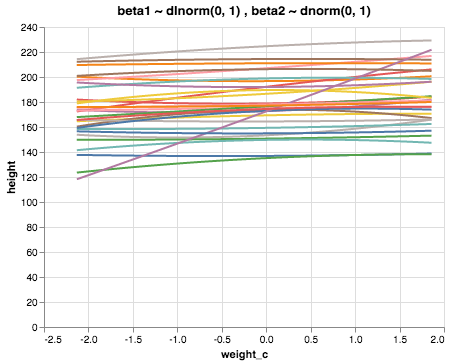

In [26]:
plot = alt.Chart(aux_plot)\
   .mark_line()\
   .encode(
        x=alt.X('weight_c', title='weight_c'),
        y=alt.Y('height', title='height'),
        color=alt.Color('prior', legend=None)
          )

plot.properties(title='beta1 ~ dlnorm(0, 1) , beta2 ~ dnorm(0, 1)')

Recall that the world's tallest person was 270 cm tall. The tallest person in the sample is about 180 cm. The prior curvature is not very strong. Those parabolas hardly bend at all. We can increase the standard deviation on the `beta2` prior, but that will produce some silly shapes (left below), where either average weight is tallest or shortest. That can't be right. The basic problem is that `beta2` needs to be negative to make the curve bend down, but `beta1` has to also change in order to move the maximum height to the right. It's all a bit confusing, and is they key reason that working with polynomial models is so hard. The prior on the right below can only bend down, but I've made the linear model `a + beta1*weight_c - beta2*weight_c_2` and given `beta2` a logNormal prior.

In [27]:
d2 = d
d2 = d2.assign(weight_c=pd.Series(d2.weight - d2.weight.mean())/d2.weight.std())
d2 = d2.assign(weight_c_2=pd.Series(d2.weight_c**2))

_Please note I'm running three models in the same snippet for simplicity. The only differences are the priors._

In [28]:
with pm.Model() as model_3:
    # Data
    weight_c = pm.Data('weight_c', d2['weight_c'].values)
    weight_c_2 = pm.Data('weight_c_2', d2['weight_c_2'].values)
    height = pm.Data('height', d2['height'].values)
    
    # Priors
    alpha = pm.Normal('alpha', mu=178, sd=20)
    beta1_1 = pm.Lognormal('beta1_1', mu=0, sd=1)
    beta2_1 = pm.Normal('beta2_1', mu=0, sd=10) # increasing the sd
    
    beta1_2 = pm.Lognormal('beta1_2', mu=2, sd=1)
    beta2_2 = pm.Lognormal('beta2_2', mu=1, sd=1) # making beta2 a lognormal
    
    beta1_3 = pm.Normal('beta1_3', mu=0, sd=100) # flat prior
    beta2_3 = pm.Normal('beta2_3', mu=0, sd=100) # flat prior
    
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    # Regressions
    mu_1 = alpha + beta1_1 * weight_c + beta2_1 * weight_c_2
    height_hat_1 = pm.Normal('height_hat_1', mu=mu_1, sd=sigma, observed=height)
    
    mu_2 = alpha + beta1_2 * weight_c - beta2_2 * weight_c_2 # note the sign change
    height_hat_2 = pm.Normal('height_hat_2', mu=mu_2, sd=sigma, observed=height)
    
    mu_3 = alpha + beta1_3 * weight_c + beta2_3 * weight_c_2
    height_hat_3 = pm.Normal('height_hat_3', mu=mu_3, sd=sigma, observed=height)
    
    # Prior sampling, trace definition and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior_3 = pm.sample()
    posterior_pred_3 = pm.sample_posterior_predictive(posterior_3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta2_3, beta1_3, beta2_2, beta1_2, beta2_1, beta1_1, alpha]
100%|██████████| 2000/2000 [00:52<00:00, 37.90it/s]


In [81]:
df = pd.DataFrame()
df = df.assign(alpha = pd.Series(prior['alpha']),
               sigma = pd.Series(prior['sigma']),
               beta1_1 = pd.Series(prior['beta1_1']),
               beta2_1 = pd.Series(prior['beta2_1']),
               beta1_2 = pd.Series(prior['beta1_2']),
               beta2_2 = pd.Series(prior['beta2_2']),
               beta1_3 = pd.Series(prior['beta1_3']),
               beta2_3 = pd.Series(prior['beta2_3']))

In [82]:
df.head()

,alpha,sigma,beta1_1,beta2_1,beta1_2,beta2_2,beta1_3,beta2_3
0,174.900998,7.264140,0.939067,-11.344971,3.215034,0.980401,-6.743351,-15.686045
1,192.935702,8.193026,0.519352,-3.573985,2.470305,2.705127,67.586147,56.931776
2,194.906673,13.476760,1.030064,-5.529674,6.735777,3.593835,205.460102,19.219400
3,191.899950,1.687804,6.197893,-16.481562,28.411498,15.928632,2.799394,57.436045
4,182.414696,28.177356,0.581860,6.988846,22.424196,3.230487,-72.042675,238.269823


_Now some data wrangling._

In [83]:
priors_1 = pd.DataFrame()
priors_2 = pd.DataFrame()
priors_3 = pd.DataFrame()

for i in range(30): # 30 parabolas is fine
    priors_1['prior_'+str(i)] = df.loc[i,'alpha'] + df.loc[i,'beta1_1'] * d2['weight_c'] + df.loc[i,'beta2_1'] * d2['weight_c_2']
    priors_2['prior_'+str(i)] = df.loc[i,'alpha'] + df.loc[i,'beta1_2'] * d2['weight_c'] - df.loc[i,'beta2_2'] * d2['weight_c_2'] # note the sign change
    priors_3['prior_'+str(i)] = df.loc[i,'alpha'] + df.loc[i,'beta1_3'] * d2['weight_c'] + df.loc[i,'beta2_3'] * d2['weight_c_2']

aux_1 = pd.concat([d2.weight_c, priors_1], axis=1)
aux_2 = pd.concat([d2.weight_c, priors_2], axis=1)
aux_3 = pd.concat([d2.weight_c, priors_3], axis=1)

In [84]:
aux_1_plot = aux_1.melt(id_vars=['weight_c'],
                      value_vars=list(aux_1.columns)[1:],
                      var_name='prior',
                      value_name='height')

aux_2_plot = aux_2.melt(id_vars=['weight_c'],
                      value_vars=list(aux_2.columns)[1:],
                      var_name='prior',
                      value_name='height')

aux_3_plot = aux_3.melt(id_vars=['weight_c'],
                      value_vars=list(aux_3.columns)[1:],
                      var_name='prior',
                      value_name='height')

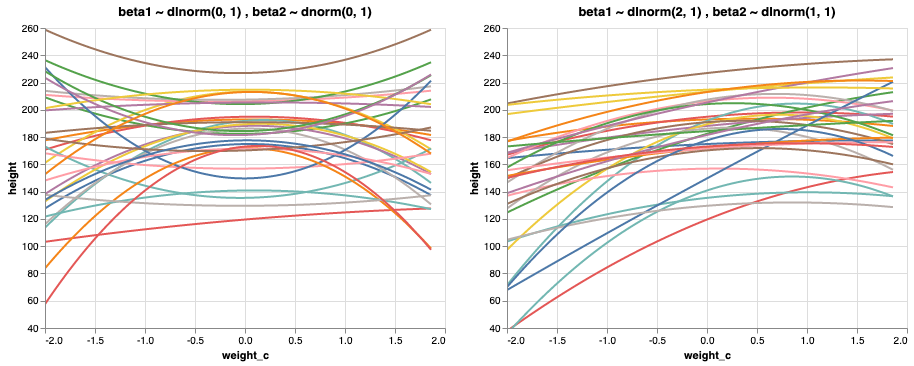

In [85]:
plot_1 = alt.Chart(aux_1_plot)\
   .mark_line(clip=True)\
   .encode(
        x=alt.X('weight_c', title='weight_c', scale=alt.Scale(domain=(-2, 2))),
        y=alt.Y('height', title='height', scale=alt.Scale(domain=(50, 250))),
        color=alt.Color('prior', legend=None)
          )

plot_2 = alt.Chart(aux_2_plot)\
   .mark_line(clip=True)\
   .encode(
        x=alt.X('weight_c', title='weight_c', scale=alt.Scale(domain=(-2, 2))),
        y=alt.Y('height', title='height', scale=alt.Scale(domain=(50, 250))),
        color=alt.Color('prior', legend=None)
          )

alt.hconcat(plot_1.properties(title='beta1 ~ dlnorm(0, 1) , beta2 ~ dnorm(0, 1)'),
            plot_2.properties(title='beta1 ~ dlnorm(2, 1) , beta2 ~ dlnorm(1, 1)'))


A key problem in getting reasonable curves here is that obviously a and `beta1` and `beta2` are correlated in the family of reasonable curves. But the priors are uncorrelated, they are independent of one another. Still, if you can get independent priors to at least live within some reasonably space of outcome values, that's a lot better than flat priors. What would flat priors look like here? Something like this:

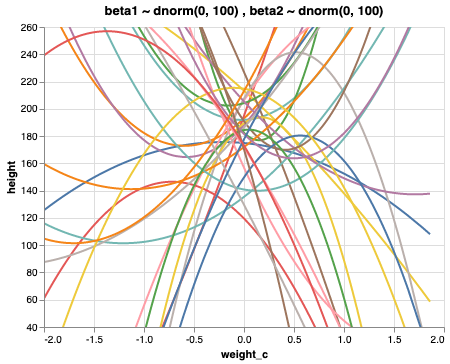

In [86]:
plot_3 = alt.Chart(aux_3_plot)\
   .mark_line(clip=True)\
   .encode(
        x=alt.X('weight_c', title='weight_c', scale=alt.Scale(domain=(-2, 2))),
        y=alt.Y('height', title='height', scale=alt.Scale(domain=(50, 250))),
        color=alt.Color('prior', legend=None)
          )

plot_3.properties(title='beta1 ~ dnorm(0, 100) , beta2 ~ dnorm(0, 100)')


These prior curves actually strongly favor explosive growth or shrinkage near
the mean. This is a general phenomenon with “flat” priors: Once the predictor is at all complicated, “flat” does not imply “no relationship.”
Do any of the priors above make a difference for inference in this sample?
No. There is a lot of data and the model is quite simple, in terms of the way
that parameters relate to predictions. This will not always be the case.

## RYAN STUFF

Tried out a basis spline on the height data and it would not work.

Trying out example I found with splines for cherry blossom data.

In [32]:
# read cherry blossom data
cb = pd.read_csv('../../data/cherry_blossoms.csv')
# drop missing temp
cb = cb[~cb['temp'].isna()]

In [35]:
# set up B spline with 15 knots for years
num_knots = 15
knot_list = np.quantile(cb.year, q=np.linspace(0,1, num = num_knots))
print('knot_list: ', knot_list) # view knots

knot_list:  [ 839.          937.21428571 1017.42857143 1097.64285714 1177.85714286
 1258.07142857 1338.28571429 1418.5        1498.71428571 1578.92857143
 1659.14285714 1739.35714286 1819.57142857 1899.78571429 1980.        ]


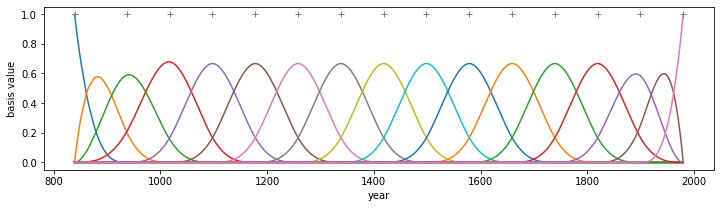

In [37]:
#### Code Block 4.74 ####
# Construct our B matrix (example from
# https://patsy.readthedocs.io/en/latest/spline-regression.html#general-b-splines)
B = patsy.dmatrix("bs(year, knots=knots, degree=3, include_intercept=True)",
                   data={'year': cb.year.values,
                         'knots': knot_list[1:-1]})
B.shape

#### Code Block 4.75 ####
# Plot each of the lines (note, I am skipping the first "intercept" column, which
# the book also skips -- truthfully, I don't know why he had "bs" include an intercept,
# when he later (code block 4.76) seems to use a model that seems to define its own
# intercept "a" term
plt.figure(figsize=(12,3))
for i in range(1, B.shape[1]):
    plt.plot(cb.year, B[:, i])
plt.plot(knot_list, [1 for x in knot_list], '+')
plt.xlabel('year')
plt.ylabel('basis value')
plt.show()

In [40]:
# Set the seed for reproducibility
with pm.Model() as mdl_no_forloop:
    # Priors of parameters
    a = pm.Normal('a', 6, 10)
    ws = pm.Normal('w', mu=0, sd=1, shape=B.shape[1])
    sigma = pm.Exponential('sigma', 1)
    
    # Regression
    mu = pm.Deterministic('mu', a + pm.math.dot(np.asarray(B), ws.T)) # regression of basis
    T = pm.Normal('T', mu, sigma, observed=cb.temp) # likelihood
    
    # Prior sampling, trace definition, and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior = pm.sample(draws=1000, tune=1000)
    posterior_pred = pm.sample_posterior_predictive(posterior_2_2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, w, a]
Sampling 2 chains:   0%|          | 0/4000 [08:41<?, ?draws/s]


ValueError: Not enough samples to build a trace.

Hmm this appears to not be able to intiate chain either. Maybe not able to run MCMC efficiently with B splines? 

Maybe worth figuring out how to write quadratic approximation?

### Now with B splines
Ryan's addition

Note MCMC with NUTS says there isn't enough samples to build a trace... bummer? So many parts in the basis spline?

In [252]:
# set up B spline with 5 knots
num_knots = 4
knot_list = np.quantile(d2.weight, q=np.linspace(0,1, num = num_knots))
print('knot_list: ', knot_list) # view knots

knot_list:  [ 4.252425  32.4601775 44.565414  62.992589 ]


In [253]:
# construct B spline
B = patsy.dmatrix("bs(weight, knots=knots, degree=3, include_intercept=True)", 
                 data = {'weight': d2.weight,
                         'knots': knot_list[1:-1]})

Ryan note, can't quite figure out how to pass the B spline as data, but this seems to at least run?

In [255]:
with pm.Model() as model_2_3:    
    # Priors
    alpha = pm.Normal('alpha', mu=178, sd=20)
    w = pm.Normal('w', mu = 0, sd = 10, shape = (B.shape[1]))
    sigma = pm.Exponential('sigma', 1) # exponential prior
    
    # Regression
    mu = pm.Deterministic('mu', alpha + pm.math.dot(np.asarray(B), w.T))
    height_hat = pm.Normal('height_hat', mu=mu, sd=sigma, observed=d2.height)
    
    # Prior sampling, trace definition and posterior sampling
    prior = pm.sample_prior_predictive()
    posterior_2_3 = pm.sample(draws=1000, tune=1000)
    posterior_pred_2_3 = pm.sample_posterior_predictive(posterior_2_3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w, alpha]


Sampling 4 chains:   0%|          | 0/8000 [00:00<?, ?draws/s]

ValueError: Not enough samples to build a trace.